# **Project Title**

#### **Team Members**
*   Nihal Ahmed Mannath
*   Michele Cobelli
*   Salvador Cantuarias

#### **Project description** *(max 150 words)*
The project aims to detect and classify the type of greenery elements in a satellite image using color and edge detection.
The project is located in

*Please include the following:*
*   Where is the project situated?
*   What is the research aim?
*   What methods did you use?
*   What KPI's did you extract and why?

#### **Project Results**
*(bullet points with key outcomes and learnings)*
*   Outcomes
*   Limitations
*   Future Work









**Dependencies**


> Install required libraries



In [81]:

import io
import requests
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont
import math
import os
import cv2

In [82]:
import ee
import geemap

In [84]:
ee.Authenticate()
ee.Initialize(project='ee-nihalmannath')

**Select Location**


> Extract satellite images based on longitude, latitude and bbox




Image dimensions: 2232px × 2232px
Resolution: 0.90 meters per pixel
Downloaded 10/90 tiles (11.1%)
Downloaded 20/90 tiles (22.2%)
Downloaded 30/90 tiles (33.3%)
Downloaded 40/90 tiles (44.4%)
Downloaded 50/90 tiles (55.6%)
Downloaded 60/90 tiles (66.7%)
Downloaded 70/90 tiles (77.8%)
Downloaded 80/90 tiles (88.9%)
Downloaded 90/90 tiles (100.0%)
Large image saved to ..\src\Nihal\PNG\large_image.png
Actual area covered: 1999.7m × 1999.7m
Grid overlay image saved to ..\src\Nihal\PNG\large_image_grid_preview.png


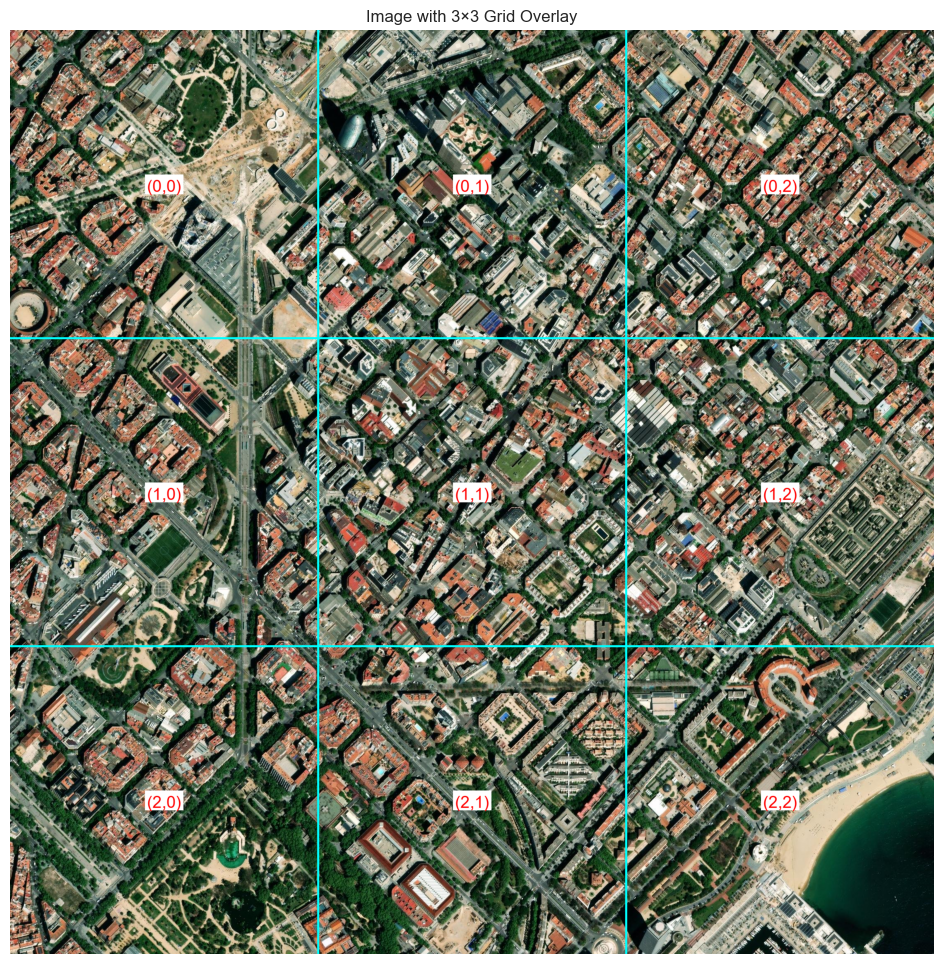

Saved tile to ..\src\Nihal\PNG\tile_41.396536_2.194554_r0_c0.png


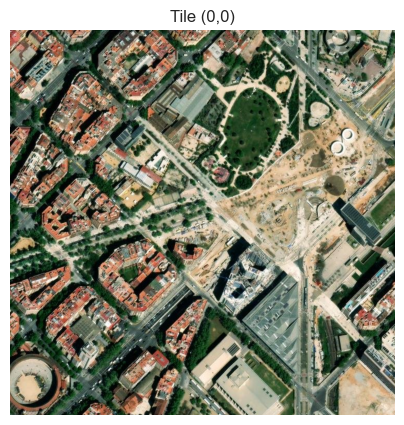

Saved tile to ..\src\Nihal\PNG\tile_41.396536_2.194554_r0_c1.png


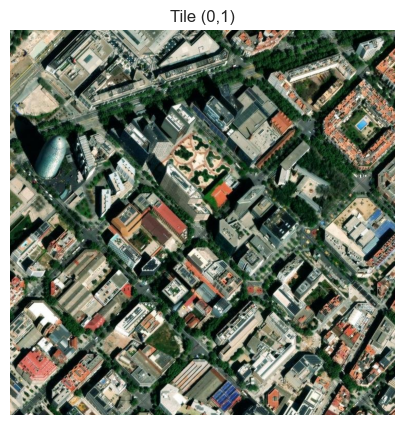

Saved tile to ..\src\Nihal\PNG\tile_41.396536_2.194554_r0_c2.png


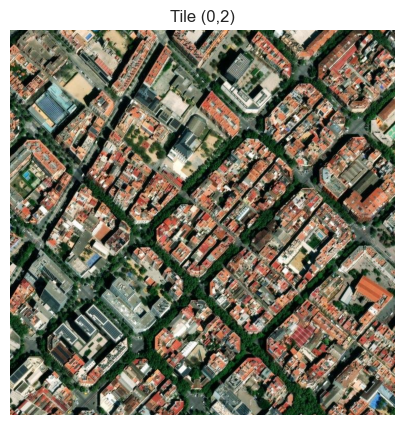

Saved tile to ..\src\Nihal\PNG\tile_41.396536_2.194554_r1_c0.png


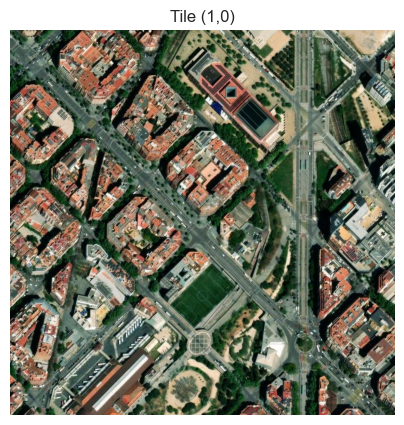

Saved tile to ..\src\Nihal\PNG\tile_41.396536_2.194554_r1_c1.png


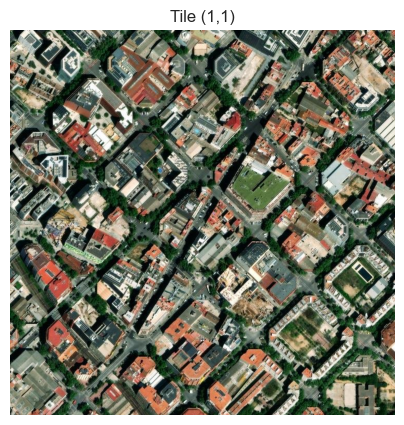

Saved tile to ..\src\Nihal\PNG\tile_41.396536_2.194554_r1_c2.png


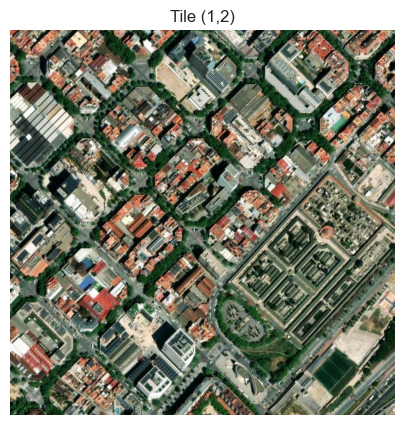

Saved tile to ..\src\Nihal\PNG\tile_41.396536_2.194554_r2_c0.png


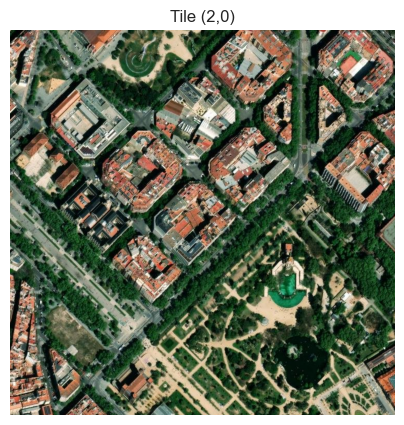

Saved tile to ..\src\Nihal\PNG\tile_41.396536_2.194554_r2_c1.png


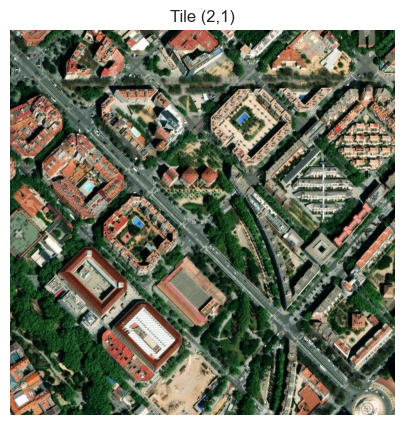

Saved tile to ..\src\Nihal\PNG\tile_41.396536_2.194554_r2_c2.png


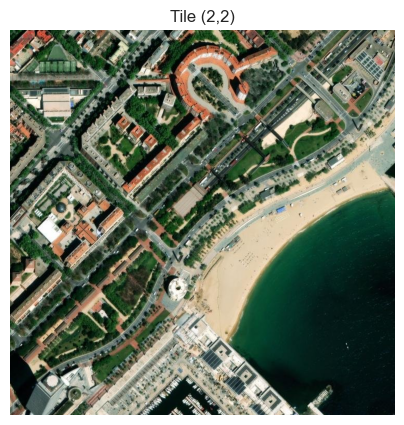

Mosaic saved to ..\src\Nihal\PNG\mosaic_{lat}_{lon}.png


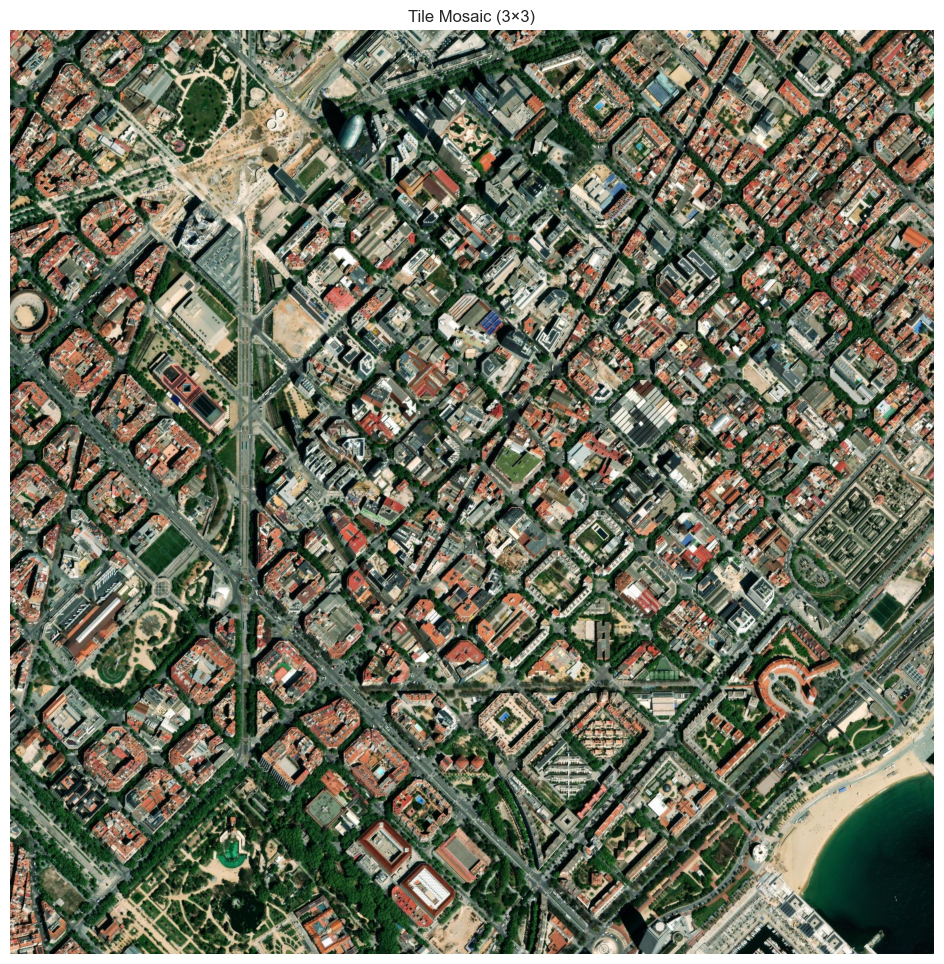

Each tile covers approximately 666.6m × 666.6m


In [86]:
def calculate_zoom_for_physical_size(lat, physical_size_meters, width_pixels=800):
    """
    Calculate appropriate zoom level for a specific physical area.

    This function determines which zoom level will display the area at
    the desired physical size with appropriate resolution.
    """
    # Earth's circumference at the equator in meters
    earth_circumference = 40075016.686

    # At zoom level 0, the entire world is 256 pixels wide
    meters_per_pixel_at_zoom_0 = earth_circumference / 256

    # Adjust for latitude (distances get smaller as you move away from equator)
    meters_per_pixel_at_lat_zoom_0 = meters_per_pixel_at_zoom_0 * np.cos(np.radians(lat))

    # Calculate how many meters each pixel needs to represent
    meters_per_pixel_needed = physical_size_meters / width_pixels

    # Calculate the zoom level where pixels will represent this physical size
    # Each zoom level doubles the detail (halves the physical size per pixel)
    zoom = np.log2(meters_per_pixel_at_lat_zoom_0 / meters_per_pixel_needed)

    # Round and clamp to valid zoom range (1-19)
    return max(1, min(19, round(zoom)))

def download_large_satellite_image(lat, lon, width_meters, height_meters, resolution, output_file=None):
    """
    Download a large satellite image covering the specified area.

    This is the main function that determines the appropriate zoom level
    and dimensions for the image, then downloads it.
    """
    # Calculate zoom level based on the larger dimension
    # This ensures we get the right level of detail
    larger_dimension_meters = max(width_meters, height_meters)
    zoom = calculate_zoom_for_physical_size(lat, larger_dimension_meters, resolution)

    # Calculate actual meters per pixel at this zoom level
    # This tells us the ground resolution of our image
    earth_circumference = 40075016.686
    meters_per_pixel = (earth_circumference * np.cos(np.radians(lat))) / (256 * (2 ** zoom))

    # Calculate required image dimensions in pixels
    # This converts our desired physical dimensions to pixel dimensions
    width_pixels = int(width_meters / meters_per_pixel)
    height_pixels = int(height_meters / meters_per_pixel)

    print(f"Downloading {width_meters}m × {height_meters}m area at zoom level {zoom}")
    print(f"Image dimensions: {width_pixels}px × {height_pixels}px")
    print(f"Resolution: {meters_per_pixel:.2f} meters per pixel")

    # Use the download function to get the actual image
    image = download_esri_satellite_image(lat, lon, width_pixels, height_pixels, zoom, output_file)

    # Return the image and actual dimensions
    # The actual dimensions might differ slightly from requested due to rounding
    actual_width_meters = width_pixels * meters_per_pixel
    actual_height_meters = height_pixels * meters_per_pixel

    return image, actual_width_meters, actual_height_meters

def download_esri_satellite_image(lat, lon, width, height, zoom, output_file=None):
    """
    Download a satellite image from ESRI World Imagery service.

    This function handles the actual downloading of tiles from the
    ESRI map service and stitches them together.
    """
    # These helper functions convert geographic coordinates to tile coordinates
    # This is how we determine which map tiles to download
    def lon_to_x(lon, zoom):
        return ((lon + 180) / 360) * (2 ** zoom)

    def lat_to_y(lat, zoom):
        lat_rad = math.radians(lat)
        return (1 - math.log(math.tan(lat_rad) + 1/math.cos(lat_rad)) / math.pi) / 2 * (2 ** zoom)

    # Calculate the center tile coordinates
    x_tile = lon_to_x(lon, zoom)
    y_tile = lat_to_y(lat, zoom)

    # Create a blank image to hold our map
    result = Image.new('RGB', (width, height))

    # Calculate the range of tiles we need to download
    # Map tiles are 256×256 pixels, so we calculate how many we need
    x_min = int(x_tile - (width / 256) / 2)
    y_min = int(y_tile - (height / 256) / 2)
    x_max = int(x_tile + (width / 256) / 2) + 1
    y_max = int(y_tile + (height / 256) / 2) + 1

    # Track download progress
    total_tiles = (x_max - x_min) * (y_max - y_min)
    tiles_downloaded = 0

    print(f"Downloading {total_tiles} map tiles...")

    # Download each tile and stitch them together
    # This loops through all the tiles we need and downloads each one
    for x in range(x_min, x_max):
        for y in range(y_min, y_max):
            # ESRI World Imagery tile URL format
            url = f"https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{zoom}/{y}/{x}"

            try:
                # Download the tile
                response = requests.get(url)
                if response.status_code == 200:
                    # Convert the response to an image
                    tile = Image.open(io.BytesIO(response.content))

                    # Calculate where to paste this tile in our result image
                    paste_x = (x - x_min) * 256
                    paste_y = (y - y_min) * 256

                    # Paste the tile into the result image
                    result.paste(tile, (paste_x, paste_y))

                    # Update progress
                    tiles_downloaded += 1
                    if tiles_downloaded % 10 == 0 or tiles_downloaded == total_tiles:
                        print(f"Downloaded {tiles_downloaded}/{total_tiles} tiles ({tiles_downloaded/total_tiles*100:.1f}%)")

            except Exception as e:
                print(f"Error downloading tile {x},{y}: {e}")

    # Crop image to exact dimensions
    # This ensures we get exactly the size we requested
    center_x = (width // 2)
    center_y = (height // 2)
    left = center_x - (width // 2)
    upper = center_y - (height // 2)
    right = center_x + (width // 2)
    lower = center_y + (height // 2)

    result = result.crop((left, upper, right, lower))

    # Save if output file specified
    if output_file:
        result.save(output_file)
        print(f"Large image saved to {output_file}")

    return result

def add_grid_overlay(image, rows, cols, output_file=None):
    """
    Add a grid overlay to an image with row and column labels.

    This function adds a visual grid showing how the image will be divided,
    with coordinates for each tile.
    """
    # Create a copy of the image to draw on
    overlay_image = image.copy().convert('RGBA')
    draw = ImageDraw.Draw(overlay_image)

    # Get image dimensions
    width, height = image.size

    # Calculate tile dimensions
    tile_width = width // cols
    tile_height = height // rows

    # Draw vertical grid lines
    for i in range(1, cols):
        x = i * tile_width
        draw.line([(x, 0), (x, height)], fill=(0, 255, 255, 180), width=5)

    # Draw horizontal grid lines
    for i in range(1, rows):
        y = i * tile_height
        draw.line([(0, y), (width, y)], fill=(0, 255, 255, 180), width=5)

    # Draw tile labels
    try:
        # Try to use a TrueType font if available
        font = ImageFont.truetype("arial.ttf", 40)
    except IOError:
        # Fallback to default font
        font = ImageFont.load_default()

    for row in range(rows):
        for col in range(cols):
            # Calculate center of the tile
            center_x = col * tile_width + tile_width // 2
            center_y = row * tile_height + tile_height // 2

            # Draw tile label
            label = f"({row},{col})"

            # Get text size
            try:
                text_bbox = draw.textbbox((0, 0), label, font=font)
                text_width = text_bbox[2] - text_bbox[0]
                text_height = text_bbox[3] - text_bbox[1]
            except AttributeError:
                # For older Pillow versions
                text_width, text_height = draw.textsize(label, font=font)

            # Position the text in the center of the tile
            text_x = center_x - text_width // 2
            text_y = center_y - text_height // 2

            # Draw white rectangle behind text for better visibility
            padding = 5
            draw.rectangle(
                [
                    text_x - padding,
                    text_y - padding,
                    text_x + text_width + padding,
                    text_y + text_height + padding
                ],
                fill=(255, 255, 255, 180)  # Semi-transparent white
            )

            # Draw the text
            draw.text((text_x, text_y), label, fill=(255, 0, 0), font=font)

    # Convert back to RGB for compatibility
    overlay_image = overlay_image.convert('RGB')

    # Save the image if output file specified
    if output_file:
        overlay_image.save(output_file)
        print(f"Grid overlay image saved to {output_file}")

    # Display the image
    plt.figure(figsize=(12, 12))
    plt.imshow(overlay_image)
    plt.title(f"Image with {rows}×{cols} Grid Overlay")
    plt.axis('off')
    plt.show()

    return overlay_image

def cut_image_into_tiles(image, rows, cols, output_dir=None, base_filename="tile"):
    """
    Cut a single large image into a grid of smaller tiles.

    This function takes the downloaded image and divides it into
    the requested number of smaller tile images.
    """
    # Calculate the dimensions of each tile
    width, height = image.size
    tile_width = width // cols
    tile_height = height // rows

    tiles = []

    # Create output directory if needed
    if output_dir and not os.path.exists(output_dir):
        os.makedirs(output_dir)

    # Cut image into tiles
    # We loop through each row and column, creating a tile for each position
    for row in range(rows):
        for col in range(cols):
            # Calculate tile boundaries in pixels
            left = col * tile_width
            upper = row * tile_height
            right = left + tile_width
            lower = upper + tile_height

            # Crop the tile from the large image
            tile = image.crop((left, upper, right, lower))
            tiles.append(tile)

            # Save the tile if directory specified
            if output_dir:
                tile_filename = f"{base_filename}_r{row}_c{col}.png"
                tile_path = os.path.join(output_dir, tile_filename)
                tile.save(tile_path)
                print(f"Saved tile to {tile_path}")

            # Display the tile
            plt.figure(figsize=(5, 5))
            plt.imshow(tile)
            plt.title(f"Tile ({row},{col})")
            plt.axis('off')
            plt.show()

    return tiles

def create_tile_mosaic(tiles, rows, cols, output_file=None):
    """
    Create a mosaic image from tiles (for visualization).

    This function reassembles the tiles into a single image to verify
    that they fit together correctly.
    """
    # Verify we have the correct number of tiles
    if len(tiles) != rows * cols:
        raise ValueError(f"Expected {rows*cols} tiles, got {len(tiles)}")

    # Get tile dimensions from the first tile
    tile_width, tile_height = tiles[0].size

    # Create a new blank image for the mosaic
    mosaic = Image.new('RGB', (cols * tile_width, rows * tile_height))

    # Paste each tile into the mosaic
    for i, tile in enumerate(tiles):
        # Calculate the row and column from the tile index
        row = i // cols
        col = i % cols

        # Paste the tile at the correct position
        mosaic.paste(tile, (col * tile_width, row * tile_height))

    # Save the mosaic if requested
    if output_file:
        mosaic.save(output_file)
        print(f"Mosaic saved to {output_file}")

    # Display the mosaic
    plt.figure(figsize=(12, 12))
    plt.imshow(mosaic)
    plt.title(f"Tile Mosaic ({rows}×{cols})")
    plt.axis('off')
    plt.show()

    return mosaic

def get_tiles_from_large_image(lat, lon, area_size_meters, grid_size, resolution=2048, output_dir=None, output_file=None):
    """
    Download a large satellite image and cut it into tiles.

    This is the main function that combines all the steps - downloading,
    previewing, and cutting into tiles.
    """
    rows, cols = grid_size

    # Handle area size parameter
    # Allow either a single value (square) or separate width/height
    if isinstance(area_size_meters, (int, float)):
        width_meters = height_meters = area_size_meters
    else:
        width_meters, height_meters = area_size_meters

    # Generate default output file name if not provided
    if output_file is None:
        output_file = f"satellite_{lat}_{lon}_{width_meters}x{height_meters}m.png"

    # Download the large image
    large_image, actual_width, actual_height = download_large_satellite_image(
        lat, lon, width_meters, height_meters, resolution, output_file
    )

    print(f"Actual area covered: {actual_width:.1f}m × {actual_height:.1f}m")

    # Create a preview with grid overlay
    grid_preview = add_grid_overlay(
        large_image, rows, cols,
        output_file=output_file.replace('.png', '_grid_preview.png')
    )

    # Cut the image into tiles
    base_filename = f"tile_{lat}_{lon}"
    tiles = cut_image_into_tiles(large_image, rows, cols, output_dir, base_filename)

    # Create a mosaic for visualization
    mosaic = create_tile_mosaic(tiles, rows, cols, r"..\src\Nihal\PNG\mosaic_{lat}_{lon}.png")

    # Calculate and display the physical size of each tile
    tile_width_meters = actual_width / cols
    tile_height_meters = actual_height / rows
    print(f"Each tile covers approximately {tile_width_meters:.1f}m × {tile_height_meters:.1f}m")

    return large_image, tiles

# Example usage
def example_efficient_tiling():
    """
    Example function showing how to use the tile generator.

    This downloads a 2km x 2km area around Barcelona and cuts it into a 3x3 grid.
    """
    # Barcelona coordinates
    lat = 41.396536
    lon = 2.194554

    #

    # Download a 2km x 2km area and cut it into a 3x3 grid
    get_tiles_from_large_image(
        lat=lat,
        lon=lon,
        area_size_meters=2000,  # 2km x 2km area
        grid_size=(3, 3),       # 3x3 grid = 9 tiles
        resolution=3000,        # Resolution parameter for large image
        output_dir=image_dir,   # Directory to save tiles (uses existing variable)
        output_file=image_path  # Filename for large image (uses existing variable)
    )

# Run the example when the script is executed directly
if __name__ == "__main__":
    example_efficient_tiling()

NDVI data shape: (1, 1, 1)


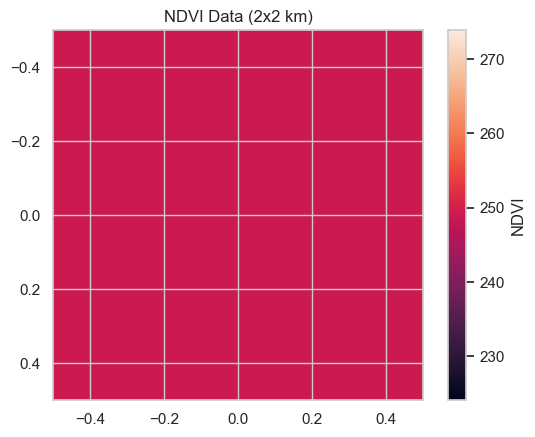

In [95]:
# Barcelona coordinates
lat = 41.396536
lon = 2.194554

# Define the bounding box for a 2km x 2km area
width_meters = 2000
height_meters = 2000
lat_offset = (height_meters / 111320) / 2
lon_offset = (width_meters / (111320 * np.cos(np.radians(lat)))) / 2

bbox = (lon - lon_offset, lat - lat_offset, lon + lon_offset, lat + lat_offset)

# Convert the region to an Earth Engine geometry
ee_region = ee.Geometry.BBox(bbox[0], bbox[1], bbox[2], bbox[3])

# Define the NDVI layer and band
layer = "NASA/GIMMS/3GV0"
band = "ndvi"
image = ee.ImageCollection(layer).select(band).first()  # Get the first image in the collection

# Extract the NDVI data as a NumPy array
array = geemap.ee_to_numpy(image, region=ee_region, bands=[band])  # 500 meters per pixel
rgb_img_test = (255 * ((array[:, :, 0:3] - 100) / 3500)).astype("uint8")
plt.imshow(rgb_img_test)

print("NDVI data shape:", array.shape)
#plt.imshow(array, cmap="YlGn")
plt.colorbar(label="NDVI")
plt.title("NDVI Data (2x2 km)")
plt.show()

**Image Segmentation**


> Select segmentation methods to extract features
*(e.g. color/line/shape detection)*


large_image.png


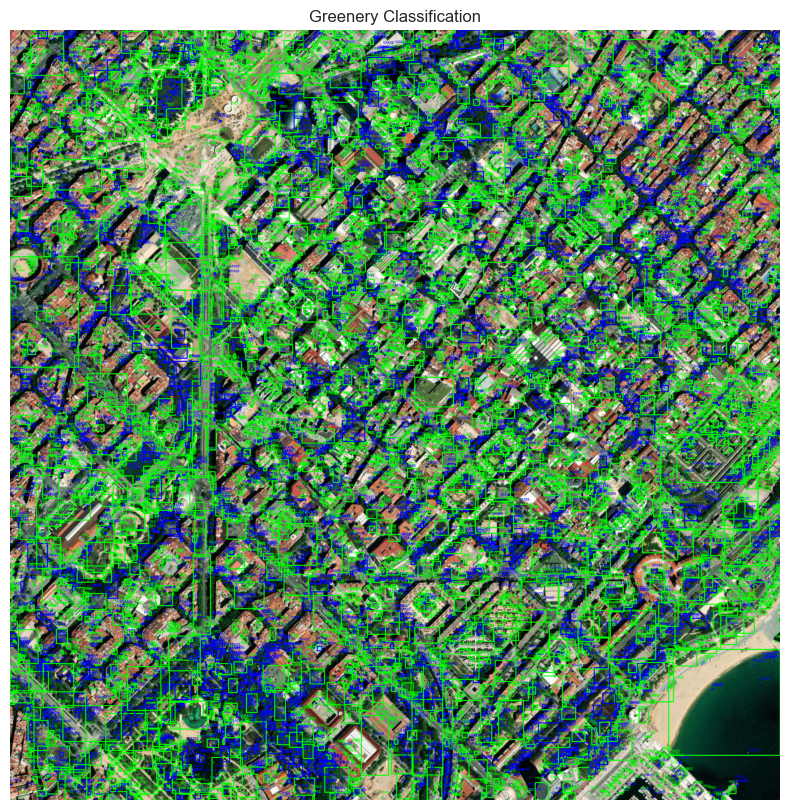

large_image_grid_preview.png
mosaic_{lat}_{lon}.png
tile_41.396536_2.194554_r0_c0.png
tile_41.396536_2.194554_r0_c1.png
tile_41.396536_2.194554_r0_c2.png
tile_41.396536_2.194554_r1_c0.png
tile_41.396536_2.194554_r1_c1.png
tile_41.396536_2.194554_r1_c2.png
tile_41.396536_2.194554_r2_c0.png
tile_41.396536_2.194554_r2_c1.png
tile_41.396536_2.194554_r2_c2.png


In [94]:
def classify_greenery(image_path):
    
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image_hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Define HSV range for green
    green_lower = np.array([35,50,90], dtype="uint8")
    green_upper = np.array([90,255,255], dtype="uint8")

    # Create a mask for green areas
    green_mask = cv2.inRange(image_hsv, green_lower, green_upper)

    green_mask = cv2.morphologyEx(green_mask, cv2.MORPH_CLOSE, np.ones((5, 5), np.uint8))


    # Detect shadows (dark regions)
    shadow_mask = cv2.adaptiveThreshold(image_gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY_INV, 11, 2)

    # Find contours of green areas
    contours, _ = cv2.findContours(green_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Classify each green area
    for contour in contours:
        # Create a mask for the current green area
        green_area_mask = np.zeros_like(green_mask)
        cv2.drawContours(green_area_mask, [contour], -1, 255, -1)

        # Check overlap with shadow mask
        overlap = cv2.bitwise_and(green_area_mask, shadow_mask)
        overlap_area = np.count_nonzero(overlap)
        green_area = np.count_nonzero(green_area_mask)

        # Classification based on shadow overlap
        if overlap_area / green_area > 0.3:  # Threshold for shadow overlap
            classification = "TREE"
            color = (0, 255, 0)  # Green
        else:
            classification = "GRASS"
            color = (0, 0, 255)  # Blue

        # Draw the classification on the image
        x, y, w, h = cv2.boundingRect(contour)
        cv2.rectangle(image_rgb, (x, y), (x + w, y + h), color, 2)
        cv2.putText(image_rgb, classification, (x, y - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.3, color, 1)

    # Display the result
    plt.figure(figsize=(10, 10))
    plt.imshow(shadow_mask, cmap='gray')
    plt.imshow(image_rgb)
    plt.axis("off")
    plt.title("Greenery Classification")
    plt.show()

# Example usage
for file in os.listdir(image_dir):
    print(file)
    if file == "large_image.png":
        classify_greenery(os.path.join(image_dir, "large_image.png"))

**KPI's**


> Use the extracted features to suggest urban resilience metrics in the form of graphs *(e.g. NDVI, green index, thermal index)*



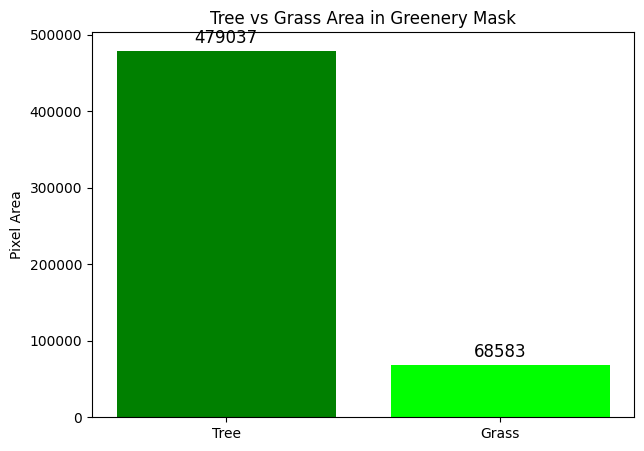

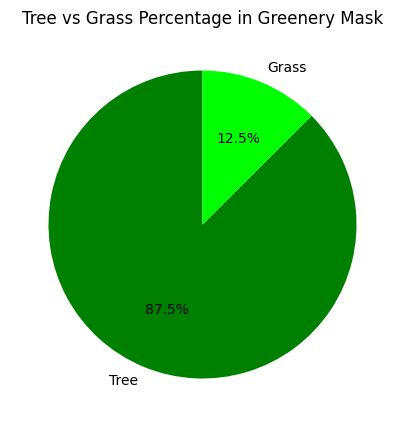

Tree mask area (pixels): 479037
Grass mask area (pixels): 68583
Tree area: 479037 pixels (9.62%)
Grass area: 68583 pixels (1.38%)


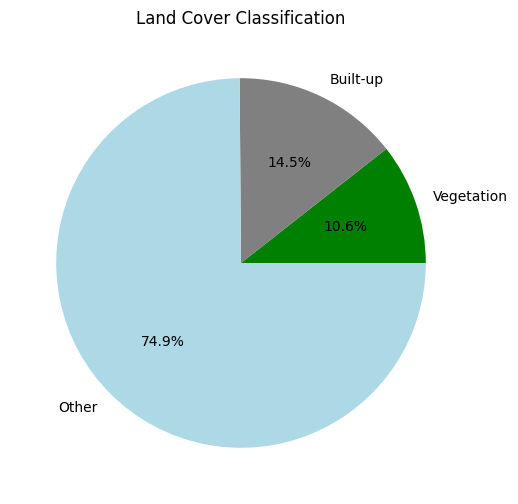

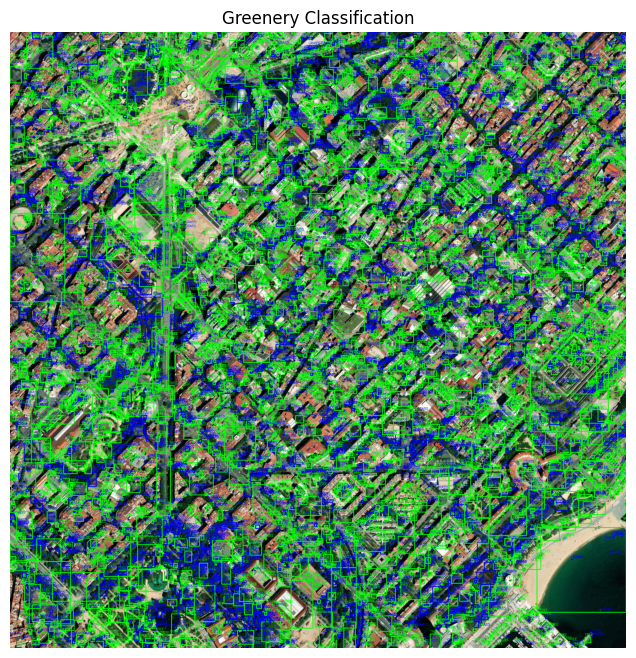

Number of TREES detected: 7264
Number of GRASS patches detected: 4750


In [13]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os

def classify_greenery_and_builtup(image_path):
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image_hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Define HSV range for green
    green_lower = np.array([35, 50, 90], dtype="uint8")
    green_upper = np.array([90, 255, 255], dtype="uint8")

    # Greenery mask
    green_mask = cv2.inRange(image_hsv, green_lower, green_upper)
    green_mask = cv2.morphologyEx(green_mask, cv2.MORPH_CLOSE, np.ones((5, 5), np.uint8))

    # Shadow detection (trees tend to cast shadows)
    shadow_mask = cv2.adaptiveThreshold(image_gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C,
                                        cv2.THRESH_BINARY_INV, 11, 2)

    # Built-up detection: assume bright gray/white areas as buildings (tune as needed)
    builtup_mask = cv2.inRange(image_gray, 180, 255)

    # Find green contours
    contours, _ = cv2.findContours(green_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    tree_count = 0
    grass_count = 0

    tree_area = 0
    grass_area = 0

    tree_mask = np.zeros_like(green_mask)
    grass_mask = np.zeros_like(green_mask)

    for contour in contours:
        green_area_mask = np.zeros_like(green_mask)
        cv2.drawContours(green_area_mask, [contour], -1, 255, -1)

        overlap = cv2.bitwise_and(green_area_mask, shadow_mask)
        overlap_area = np.count_nonzero(overlap)
        green_area = np.count_nonzero(green_area_mask)

        if green_area == 0:
            continue

        if overlap_area / green_area > 0.3:
            classification = "TREE"
            tree_count += 1
            tree_area += green_area
            tree_mask = cv2.bitwise_or(tree_mask, green_area_mask)
            color = (0, 255, 0)  # Green
        else:
            classification = "GRASS"
            grass_count += 1
            grass_area += green_area
            grass_mask = cv2.bitwise_or(grass_mask, green_area_mask)
            color = (0, 0, 255)  # Red

        x, y, w, h = cv2.boundingRect(contour)
        cv2.rectangle(image_rgb, (x, y), (x + w, y + h), color, 2)
        cv2.putText(image_rgb, classification, (x, y - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.4, color, 1)

    # Visualize tree and grass area in classified green area mask
    tree_mask_area = np.count_nonzero(tree_mask)
    grass_mask_area = np.count_nonzero(grass_mask)
    total_green_mask_area = tree_mask_area + grass_mask_area

    plt.figure(figsize=(7, 5))
    plt.bar(['Tree', 'Grass'], [tree_mask_area, grass_mask_area], color=['green', 'lime'])
    plt.ylabel('Pixel Area')
    plt.title('Tree vs Grass Area in Greenery Mask')
    for i, v in enumerate([tree_mask_area, grass_mask_area]):
        plt.text(i, v + max(tree_mask_area, grass_mask_area)*0.01, str(v), ha='center', va='bottom', fontsize=12)
    plt.show()

    # Pie chart for tree vs grass in green area
    if total_green_mask_area > 0:
        plt.figure(figsize=(5, 5))
        plt.pie([tree_mask_area, grass_mask_area], labels=['Tree', 'Grass'], 
                colors=['green', 'lime'], autopct='%1.1f%%', startangle=90)
        plt.title('Tree vs Grass Percentage in Greenery Mask')
        plt.show()

    # Calculate pixel area for tree and grass masks
    tree_mask_area = np.count_nonzero(tree_mask)
    grass_mask_area = np.count_nonzero(grass_mask)
    print(f"Tree mask area (pixels): {tree_mask_area}")
    print(f"Grass mask area (pixels): {grass_mask_area}")

    # Count vegetation and built-up area in pixels
    total_pixels = image.shape[0] * image.shape[1]
    green_pixels = np.count_nonzero(green_mask)
    builtup_pixels = np.count_nonzero(builtup_mask)
    other_pixels = total_pixels - (green_pixels + builtup_pixels)

    # Calculate area percentages
    total_green_area = tree_area + grass_area
    if total_green_area > 0:
        tree_area_pct = (tree_area / total_pixels) * 100
        grass_area_pct = (grass_area / total_pixels) * 100
    else:
        tree_area_pct = 0
        grass_area_pct = 0

    print(f"Tree area: {tree_area} pixels ({tree_area_pct:.2f}%)")
    print(f"Grass area: {grass_area} pixels ({grass_area_pct:.2f}%)")

    # Pie chart
    labels = ['Vegetation', 'Built-up', 'Other']
    sizes = [green_pixels, builtup_pixels, other_pixels]
    colors = ['green', 'gray', 'lightblue']

    plt.figure(figsize=(6, 6))
    plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%')
    plt.title("Land Cover Classification")
    plt.show()

    # Show final image with bounding boxes
    plt.figure(figsize=(12, 8))
    plt.imshow(image_rgb)
    plt.title("Greenery Classification")
    plt.axis("off")
    plt.show()

    print(f"Number of TREES detected: {tree_count}")
    print(f"Number of GRASS patches detected: {grass_count}")

# Example usage
image_path = r"..\src\Nihal\PNG\mosaic_{lat}_{lon}.png"  # <-- Set your image path here
image_dir = os.path.dirname(image_path)

if not os.path.isdir(image_dir):
    print(f"Directory does not exist: {image_dir}")
else:
    for file in os.listdir(image_dir):
        if file == "large_image.png":
            classify_greenery_and_builtup(os.path.join(image_dir, file))


Vegetation: 21.90%
Built-up Area: 14.52%
Other: 63.58%


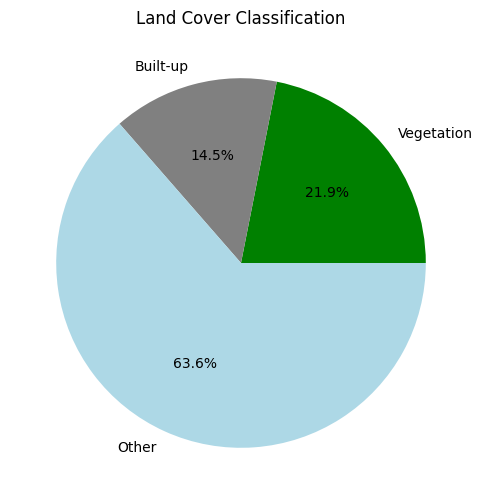

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def calculate_land_cover(image_path):
    # Load the image
    image = cv2.imread(image_path)
    image_hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Define HSV range for vegetation (green areas)
    green_lower = np.array([35, 50, 50], dtype="uint8")
    green_upper = np.array([90, 255, 255], dtype="uint8")
    green_mask = cv2.inRange(image_hsv, green_lower, green_upper)

    # Define range for built-up areas (bright regions in grayscale)
    builtup_mask = cv2.inRange(image_gray, 180, 255)

    # Calculate pixel counts
    total_pixels = image.shape[0] * image.shape[1]
    green_pixels = np.count_nonzero(green_mask)
    builtup_pixels = np.count_nonzero(builtup_mask)
    other_pixels = total_pixels - (green_pixels + builtup_pixels)

    # Calculate percentages
    green_percentage = (green_pixels / total_pixels) * 100
    builtup_percentage = (builtup_pixels / total_pixels) * 100
    other_percentage = (other_pixels / total_pixels) * 100

    # Display results
    print(f"Vegetation: {green_percentage:.2f}%")
    print(f"Built-up Area: {builtup_percentage:.2f}%")
    print(f"Other: {other_percentage:.2f}%")

    # Visualize results using a pie chart
    labels = ['Vegetation', 'Built-up', 'Other']
    sizes = [green_pixels, builtup_pixels, other_pixels]
    colors = ['green', 'gray', 'lightblue']

    plt.figure(figsize=(6, 6))
    plt.pie(sizes, labels=labels, colors=colors, autopct='%1.1f%%')
    plt.title("Land Cover Classification")
    plt.show()

# Example usage
image_path = r"..\src\Nihal\PNG\mosaic_{lat}_{lon}.png"  # Replace with the path to your image
calculate_land_cover(image_path)

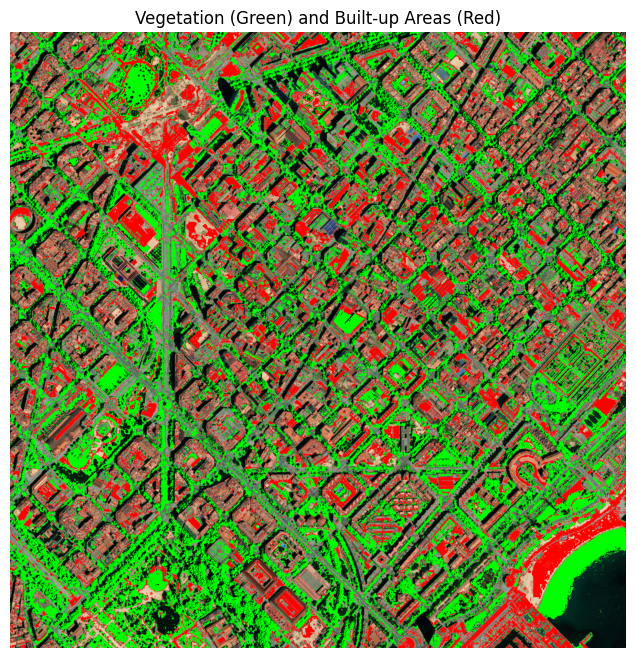

In [14]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def calculate_land_cover(image_path):
    # Load the image
    image = cv2.imread(image_path)
    image_hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Vegetation (green) mask
    green_lower = np.array([35, 50, 50], dtype="uint8")
    green_upper = np.array([90, 255, 255], dtype="uint8")
    green_mask = cv2.inRange(image_hsv, green_lower, green_upper)

    # Improved built-up detection:
    # Use both high brightness and low saturation (to avoid bright vegetation)
    builtup_mask = cv2.inRange(image_hsv, (0, 0, 180), (180, 60, 255))
    # Optionally, remove green from built-up mask
    builtup_mask = cv2.bitwise_and(builtup_mask, cv2.bitwise_not(green_mask))

    # Highlight vegetation in green
    image[green_mask > 0] = [0, 255, 0]
    # Highlight built-up areas in red
    image[builtup_mask > 0] = [0, 0, 255]

    # Display the results
    plt.figure(figsize=(12, 8))
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.title("Vegetation (Green) and Built-up Areas (Red)")
    plt.axis("off")
    plt.show()

# Example usage
calculate_land_cover(image_path)